In [30]:
import gym
import torch
import torch.nn as nn
import torch.optim as optim
import random
import numpy as np
from collections import deque

np.bool8 = np.bool_

In [31]:
env = gym.make("LunarLander-v2", render_mode="rgb_array")

In [69]:
# Hyperparameters
gamma = 0.999           # Discount factor
epsilon_start = 1.0     # Starting exploration rate
epsilon_end = 0.01      # Ending exploration rate
epsilon_decay = 0.995   # Decay rate of exploration probability
lr = 0.001              # Learning rate
batch_size = 64         # Size of each training batch
target_update = 10      # Target network update frequency
memory_size = 10000     # Replay buffer size
num_episodes = 500      # Total episodes for training

In [70]:
import torch
import torch.nn as nn
import torch.optim as optim

In [82]:
# Define the Q-network
class DQN(nn.Module):
    def __init__(self, state_dim, action_dim):
        super(DQN, self).__init__()
        self.fc1 = nn.Linear(state_dim, 128)
        self.fc2 = nn.Linear(128, 128)
        self.fc3 = nn.Linear(128, action_dim)
        self.elu = nn.ELU()

    def forward(self, x):
        x = self.elu(self.fc1(x))
        x = self.elu(self.fc2(x))
        return self.fc3(x)

# Initialize networks
state_dim = env.observation_space.shape[0]
action_dim = env.action_space.n
policy_net = DQN(state_dim, action_dim)
target_net = DQN(state_dim, action_dim)
target_net.load_state_dict(policy_net.state_dict())
target_net.eval()  # Target network does not train

# Set up optimizer and loss
optimizer = optim.Adam(policy_net.parameters(), lr=lr)
loss_fn = nn.MSELoss()

# Replay buffer for experience replay
replay_buffer = deque(maxlen=memory_size)

In [83]:
# Function to select an action using an epsilon-greedy strategy
def select_action(state, epsilon):
    if random.random() < epsilon:
        return env.action_space.sample()  # Random action
    else:
        state = torch.FloatTensor(state).unsqueeze(0)  # Convert state to tensor
        with torch.no_grad():
            return policy_net(state).argmax(dim=1).item()  # Greedy action

In [84]:
# Training loop
epsilon = epsilon_start
reward_history = []

for episode in range(num_episodes):
    i = 0
    
    state, _ = env.reset()
    total_reward = 0
    done = False
    
    while not done:
        if i == 1000:
            print("Over 10000 frames... Forcing reset")
            break
        action = select_action(state, epsilon)
        i += 1
        
        next_state, reward, done, truncated, _ = env.step(action)
        if reward > 0:
            reward *= 2.5
        replay_buffer.append((state, action, reward, next_state, done))
        state = next_state
        total_reward += reward

        # Training step
        if len(replay_buffer) >= batch_size:
            batch = random.sample(replay_buffer, batch_size)
            states, actions, rewards, next_states, dones = zip(*batch)

            states = torch.FloatTensor(states)
            actions = torch.LongTensor(actions).unsqueeze(1)
            rewards = torch.FloatTensor(rewards)
            next_states = torch.FloatTensor(next_states)
            dones = torch.FloatTensor(dones)

            # Compute current Q-values
            current_q_values = policy_net(states).gather(1, actions).squeeze()

            # Compute target Q-values
            with torch.no_grad():
                next_q_values = target_net(next_states).max(1)[0]
                target_q_values = rewards + gamma * next_q_values * (1 - dones)

            # Compute loss and optimize
            loss = loss_fn(current_q_values, target_q_values)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

    # Update target network periodically
    if episode % target_update == 0:
        target_net.load_state_dict(policy_net.state_dict())

    # Decay epsilon
    epsilon = max(epsilon_end, epsilon * epsilon_decay)

    reward_history.append(total_reward)
    print(f"Episode {episode+1}/{num_episodes}, Reward: {total_reward}, Epsilon: {epsilon:.3f}")

# Save the trained model
torch.save(policy_net.state_dict(), "lunar_lander_dqn.pth")
print("Training completed and model saved.")

Episode 1/500, Reward: -271.9939302457216, Epsilon: 0.995
Episode 2/500, Reward: -225.55707841958656, Epsilon: 0.990
Episode 3/500, Reward: -53.19624372272655, Epsilon: 0.985
Episode 4/500, Reward: -27.962986259502728, Epsilon: 0.980
Episode 5/500, Reward: -185.71506108889542, Epsilon: 0.975
Episode 6/500, Reward: 9.733622072048803, Epsilon: 0.970
Episode 7/500, Reward: -208.76820884681283, Epsilon: 0.966
Episode 8/500, Reward: -179.38901660121206, Epsilon: 0.961
Episode 9/500, Reward: 11.61638248142809, Epsilon: 0.956
Episode 10/500, Reward: -49.471718241371335, Epsilon: 0.951
Episode 11/500, Reward: -114.9006064501127, Epsilon: 0.946
Episode 12/500, Reward: -13.089893031473878, Epsilon: 0.942
Episode 13/500, Reward: -97.59349089305204, Epsilon: 0.937
Episode 14/500, Reward: -314.102876581267, Epsilon: 0.932
Episode 15/500, Reward: -373.99776913800486, Epsilon: 0.928
Episode 16/500, Reward: -121.22162525878888, Epsilon: 0.923
Episode 17/500, Reward: 46.44226319207473, Epsilon: 0.918
E

KeyboardInterrupt: 

Total reward: 140.81978610761655


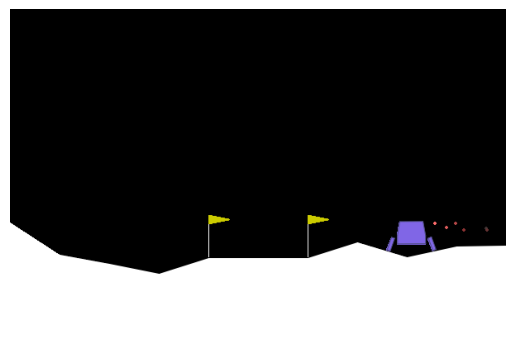

In [86]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Ensure the policy network is in evaluation mode
policy_net.eval()

frames = []
obs, _ = env.reset()

# Simulate a game using the trained policy
total_reward = 0
done = False
i = 0
while not done and i <= 4000:
    frame = env.render()
    frames.append(frame)  # Collect frame for animation

    # Convert observation to tensor and select the best action
    obs_tensor = torch.FloatTensor(obs).unsqueeze(0)
    with torch.no_grad():
        action = policy_net(obs_tensor).argmax(dim=1).item()

    # Step the environment
    obs, reward, done, truncated, info = env.step(action)
    total_reward += reward

    i += 1

env.close()

# Create animation
fig, ax = plt.subplots()
ax.axis("off")
im = ax.imshow(frames[0])

def update(frame):
    im.set_array(frames[frame])
    return [im]

# Keep a reference to the animation object
ani = animation.FuncAnimation(fig, update, frames=len(frames), interval=50)

# Prevent garbage collection and ensure display
plt.rcParams["animation.html"] = "jshtml"
display(ani)

print("Total reward:", total_reward)

plt.show()